In [1]:
import numpy as np
import pandas as pd
import altair as alt

In [2]:
data = pd.read_csv('data/nice_election_data_2008_to_2016.csv', index_col='fips_code')

In [3]:
data.head()

,county,year,dem,dem_share,gop,gop_share,oth,total,winner,dem_margin
fips_code,,,,,,,,,,
1001,Autauga County,2008,6093.0,0.257730,17403.0,0.736136,145.0,23641.0,gop,-0.478406
1001,Autauga County,2012,6354.0,0.265758,17366.0,0.726337,189.0,23909.0,gop,-0.460580
1001,Autauga County,2016,5908.0,0.239569,18110.0,0.734358,643.0,24661.0,gop,-0.494789
1003,Baldwin County,2008,19386.0,0.238119,61271.0,0.752595,756.0,81413.0,gop,-0.514476
1003,Baldwin County,2012,18329.0,0.215666,65772.0,0.773897,887.0,84988.0,gop,-0.558232


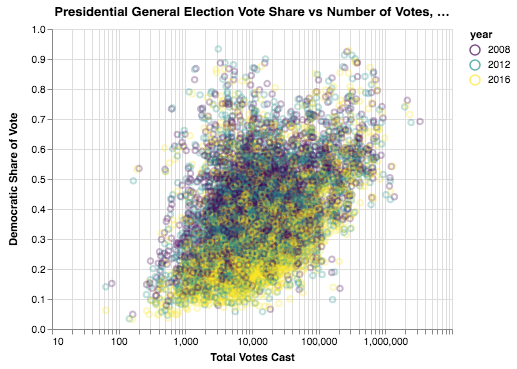

In [39]:
# Change Altair's default maximum data set size.
alt.data_transformers.enable('default', max_rows=1000000)
scatter = alt.Chart(data, title='Presidential General Election Vote Share vs Number of Votes, by County').mark_point(strokeOpacity=.4).encode(
    x=alt.X('total',
            scale=alt.Scale(type='log'),
            title='Total Votes Cast'),
    y=alt.Y('dem_share',
            title='Democratic Share of Vote'),
    color=alt.Color('year:N', scale=alt.Scale(scheme='viridis'))
)
scatter

### Run some linear regressions to create trendlines
Split the data by year.

In [5]:
data08 = data[data['year'] == 2008].copy()
data12 = data[data['year'] == 2012].copy()
data16 = data[data['year'] == 2016].copy()
dfs_by_year = [data08, data12, data16]

Train the models and make predictions.

In [6]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
import math
r2s = []
for year_data in dfs_by_year:
    model = LinearRegression()
    # Manually compute the logarithm of total votes.
    log_total = pd.DataFrame(year_data['total'].apply(lambda x: math.log(x)))
    # Train the model on log(total)
    model.fit(X=log_total, y=year_data['dem_share'])
    year_data['predicted_dem_share'] = model.predict(log_total)
    # Calculate the R2 and add it to the list.
    r2 = r2_score(y_true=year_data['dem_share'], y_pred=year_data['predicted_dem_share'])
    r2s.append(r2)
r2s

[0.17038013834707033, 0.17989435728124514, 0.24923761981179693]

Recombine into one dataset.

In [7]:
trendline_data = pd.concat(dfs_by_year)

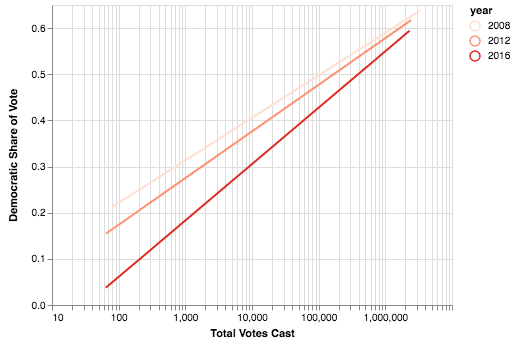

In [36]:
trendlines = alt.Chart(trendline_data).mark_line().encode(
    x=alt.X('total',
            scale=alt.Scale(type='log'),
            title='Total Votes Cast'),
    y=alt.Y('predicted_dem_share',
            title='Democratic Share of Vote'),
    color=alt.Color('year:N', scale=alt.Scale(scheme='viridis'))
)
trendlines

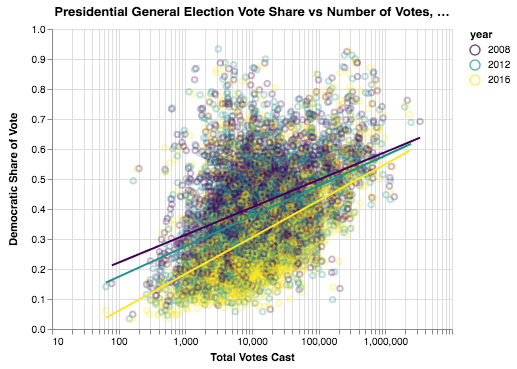

In [35]:
scatter + trendlines